<a href="https://colab.research.google.com/github/Belal0066/Digital_Image_Processing/blob/main/Copy_of_2_Image_Enhancement_in_the_Spatial_Domain.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

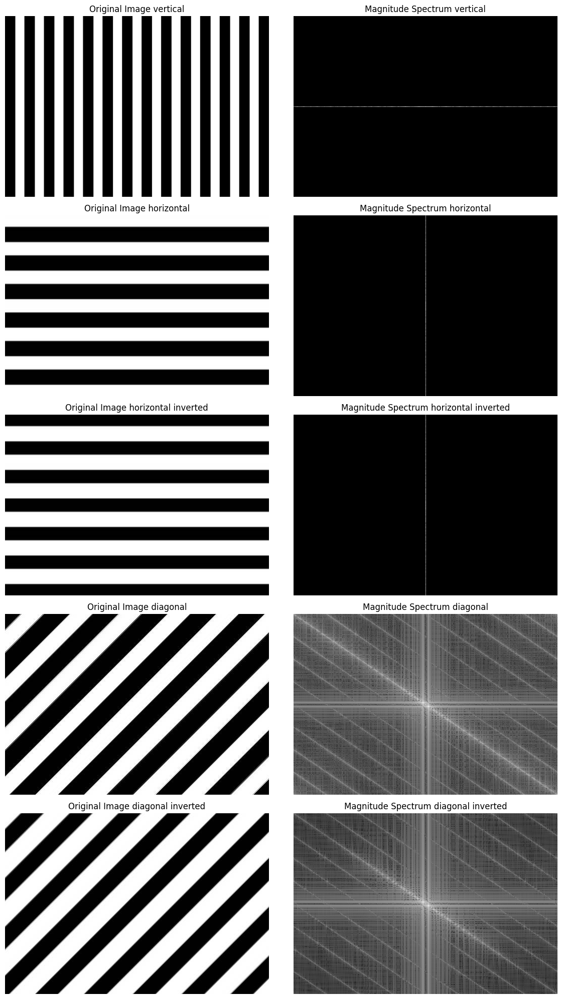

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def image_to_frequency_domain(image_path, img_name, ax1, ax2):
    # Load the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("Error: Image not found!")
        return

    # Compute the 2D Fourier Transform
    f = np.fft.fft2(img)

    # Shift the zero-frequency component to the center
    fshift = np.fft.fftshift(f)

    # Compute the magnitude spectrum
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Adding 1 to avoid log(0)

    # Plot the original image and magnitude spectrum on the provided axes
    ax1.imshow(img, cmap='gray')
    ax1.set_title(f"Original Image {img_name}")
    ax1.axis("off")

    ax2.imshow(magnitude_spectrum, cmap='gray')
    ax2.set_title(f"Magnitude Spectrum {img_name}")
    ax2.axis("off")

def combine_images():
    # Create a 5x2 grid for subplots
    fig, axes = plt.subplots(5, 2, figsize=(12, 20))

    # Image 1
    image_path = "example.jpg"  # Replace with your image path
    image_to_frequency_domain(image_path, "vertical", axes[0, 0], axes[0, 1])

    # Image 2
    image_path = "example_h.jpg"  # Replace with your image path
    image_to_frequency_domain(image_path, 'horizontal', axes[1, 0], axes[1, 1])

    # Image 3
    image_path = "example_hi.jpg"  # Replace with your image path
    image_to_frequency_domain(image_path, 'horizontal inverted', axes[2, 0], axes[2, 1])

    # Image 4
    image_path = "example_d.jpg"  # Replace with your image path
    image_to_frequency_domain(image_path, 'diagonal', axes[3, 0], axes[3, 1])

    # Image 5
    image_path = "example_di.jpg"  # Replace with your image path
    image_to_frequency_domain(image_path, 'diagonal inverted', axes[4, 0], axes[4, 1])

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Save the combined output image
    plt.savefig("combined_output.jpg")
    plt.show()

# Call the function to generate the combined image
combine_images()


Libraries imported successfully!
Original Image:


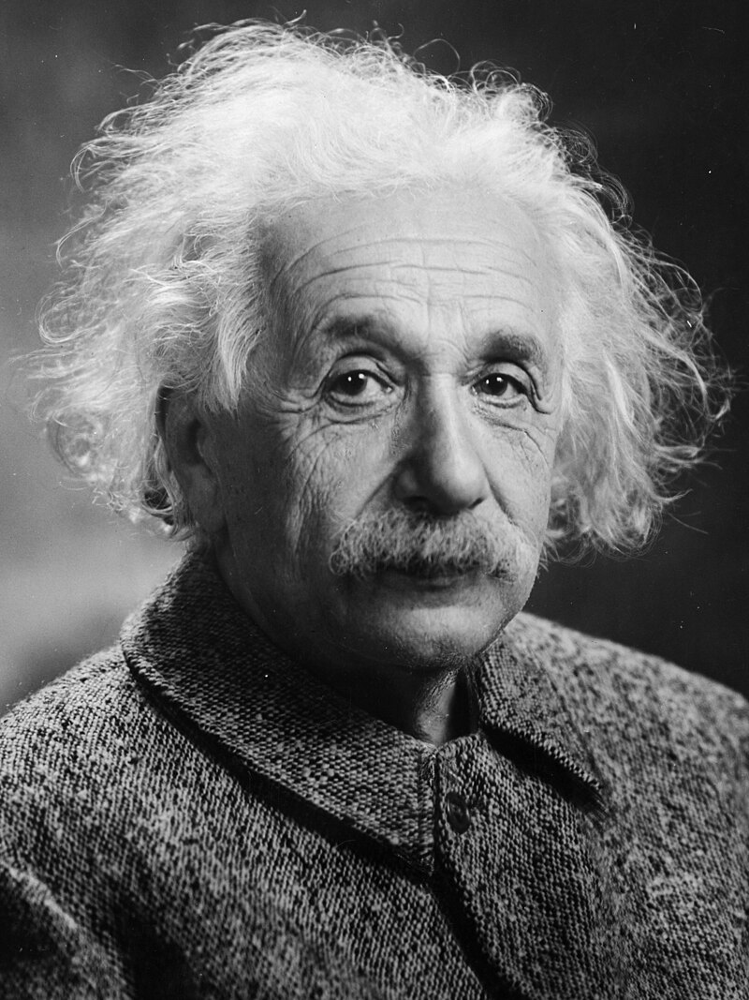

In [ ]:
# -*- coding: utf-8 -*-
"""
Image Enhancement in the Spatial Domain - Python Tutorial (Google Colab)

Based on lecture: "02 Image Enhancement in the Spatial Domain.pdf"
"""

# **Cell 1: Setup - Import Libraries**
# ---
# Import necessary libraries: OpenCV, NumPy, Matplotlib

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow # for displaying images in Colab

print("Libraries imported successfully!")

# **1. Loading an Image**

# Let's load a sample image. You can upload your own to Colab, or use a URL.
# For simplicity, we'll use a grayscale image.

# Option 1: Load from Colab file system (upload to Colab first)
einshosho = 1
if einshosho:
  image_path  = "/content/Albert_Einstein_Head.jpg"
else:
  image_path = '/content/clr.jpg' # Replace with your image file name

original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Option 2: Load from URL (using OpenCV directly - may not always work for URLs)
# image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/d3/Albert_Einstein_Head.jpg/800px-Albert_Einstein_Head.jpg"
# original_image = cv2.imread(image_url, cv2.IMREAD_GRAYSCALE)


# Check if image loaded successfully
if original_image is None:
    print("Error: Could not load image. Please check the path or URL.")
else:
    print("Original Image:")
    cv2_imshow(original_image) # Display using Colab's function

In [ ]:
# **Cell 3: 2. Spatial Domain Basics - Image as a Matrix**
# ---
# Examine the image matrix properties (shape, pixel data).

if original_image is not None:
    print("\nImage Matrix (shape and first few rows):")
    print("Shape:", original_image.shape) # (height, width) for grayscale
    print(original_image[0:5,:]) # First 5 rows, all columns
else:
    print("Please run Cell 2 to load the image first.")


Image Matrix (shape and first few rows):
Shape: (1067, 800)
[[61 61 62 ... 26 26 26]
 [60 60 61 ... 25 25 25]
 [60 61 61 ... 23 23 24]
 [62 62 61 ... 23 23 24]
 [64 63 62 ... 23 24 24]]


In [ ]:
# **Cell 4: 3. Neighborhood Operations and Convolution - Example Kernels**
# ---
# Define example kernels (masks) for different filters.

# Example Kernels (from lecture and common filters)
box_filter_kernel = np.array([[1, 1, 1],
                               [1, 1, 1],
                               [1, 1, 1]]) / 9.0  # Normalized Box Filter

identity_kernel = np.array([[0, 0, 0],
                            [0, 1, 0],
                            [0, 0, 0]])      # Identity Kernel

shift_kernel = np.array([[0, 0, 0],
                           [0, 0, 1],
                           [0, 0, 0]])      # Shift Right Kernel

vertical_sobel_kernel = np.array([[-1, 0, 1],
                                    [-2, 0, 2],
                                    [-1, 0, 1]]) # Vertical Sobel

horizontal_sobel_kernel = np.array([[-1, -2, -1],
                                      [ 0,  0,  0],
                                      [ 1,  2,  1]]) # Horizontal Sobel

laplacian_kernel = np.array([[0,  1, 0],
                              [1, -4, 1],
                              [0,  1, 0]])     # Laplacian Kernel (basic)

gaussian_kernel_3x3 = cv2.getGaussianKernel(3, 0) # Example Gaussian Kernel (OpenCV function)
gaussian_kernel_3x3_2D = gaussian_kernel_3x3 * gaussian_kernel_3x3.T # Make 2D

print("\nExample Kernels:")
print("Box Filter Kernel:\n", box_filter_kernel)
print("\nIdentity Kernel:\n", identity_kernel)
print("\nVertical Sobel Kernel:\n", vertical_sobel_kernel)
print("\nLaplacian Kernel:\n", laplacian_kernel)
print("\nGaussian Kernel (3x3):\n", gaussian_kernel_3x3_2D)


Example Kernels:
Box Filter Kernel:
 [[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]

Identity Kernel:
 [[0 0 0]
 [0 1 0]
 [0 0 0]]

Vertical Sobel Kernel:
 [[-1  0  1]
 [-2  0  2]
 [-1  0  1]]

Laplacian Kernel:
 [[ 0  1  0]
 [ 1 -4  1]
 [ 0  1  0]]

Gaussian Kernel (3x3):
 [[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]



Image Smoothed with Box Filter:


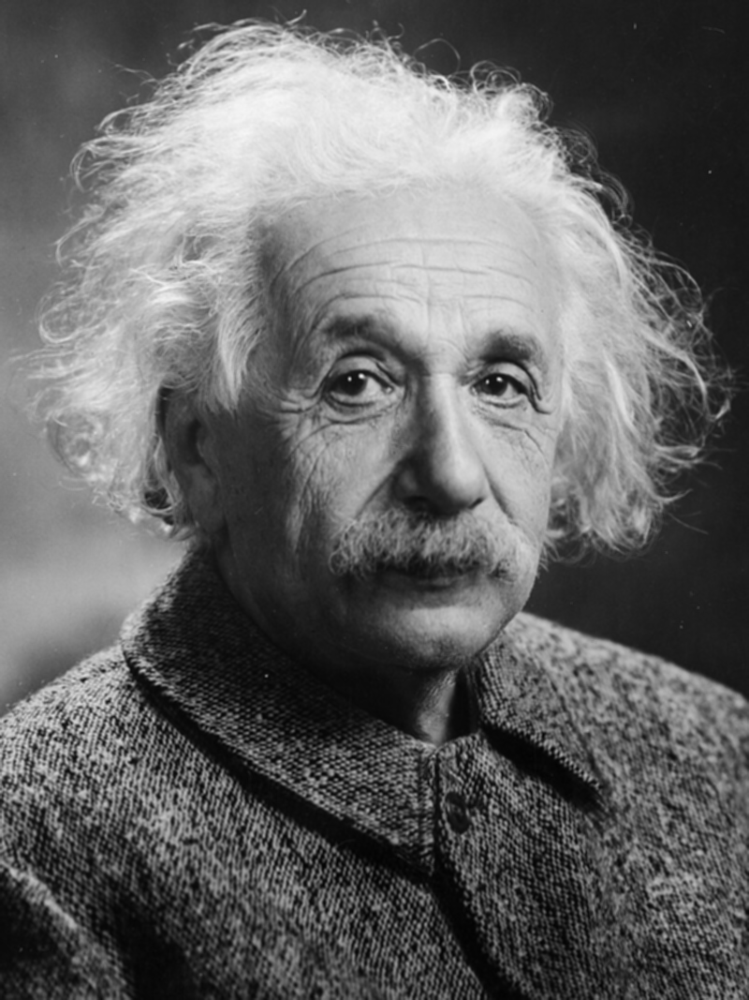

In [ ]:
# **Cell 5: 4.1. Linear Filters - Box Filter (Smoothing)**
# ---
# Apply Box Filter for smoothing using cv2.filter2D and display the result.

if original_image is not None:
    smoothed_box_image = cv2.filter2D(original_image, -1, box_filter_kernel)
    print("\nImage Smoothed with Box Filter:")
    cv2_imshow(smoothed_box_image)
else:
    print("Please run Cell 2 to load the image first.")


Image Filtered with Identity Filter (No Change):


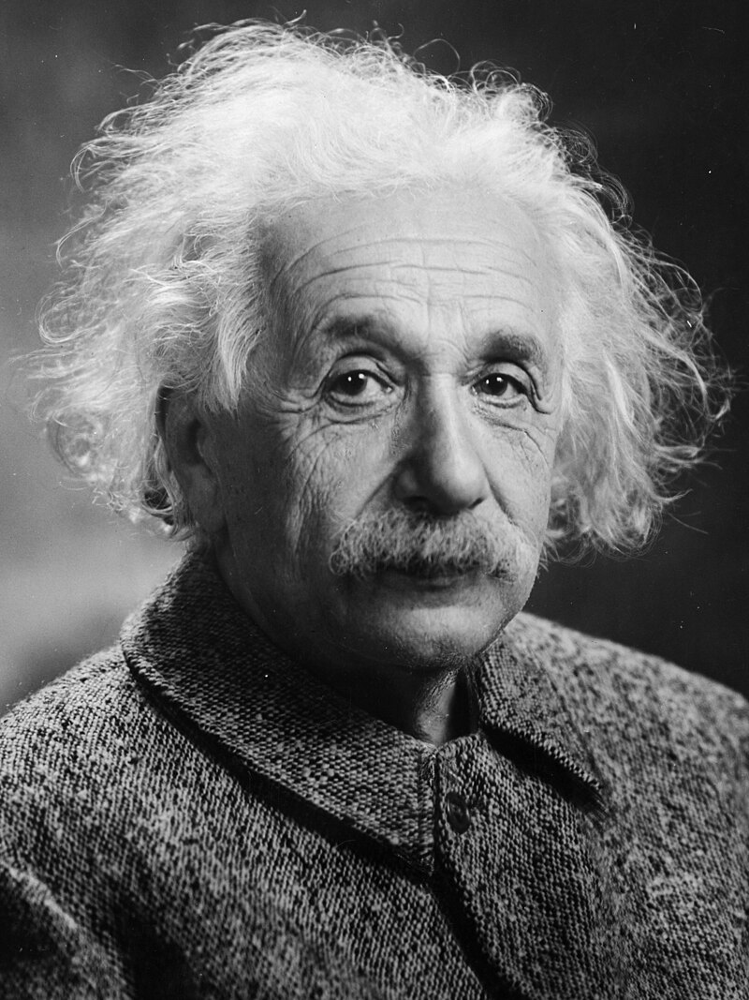

In [ ]:
# **Cell 6: 4.2. Linear Filters - Identity Filter (No Change)**
# ---
# Apply Identity Filter using cv2.filter2D and display (should be no change).

if original_image is not None:
    identity_filtered_image = cv2.filter2D(original_image, -1, identity_kernel)
    print("\nImage Filtered with Identity Filter (No Change):")
    cv2_imshow(identity_filtered_image)
else:
    print("Please run Cell 2 to load the image first.")


Image Shifted Right by 1 Pixel:


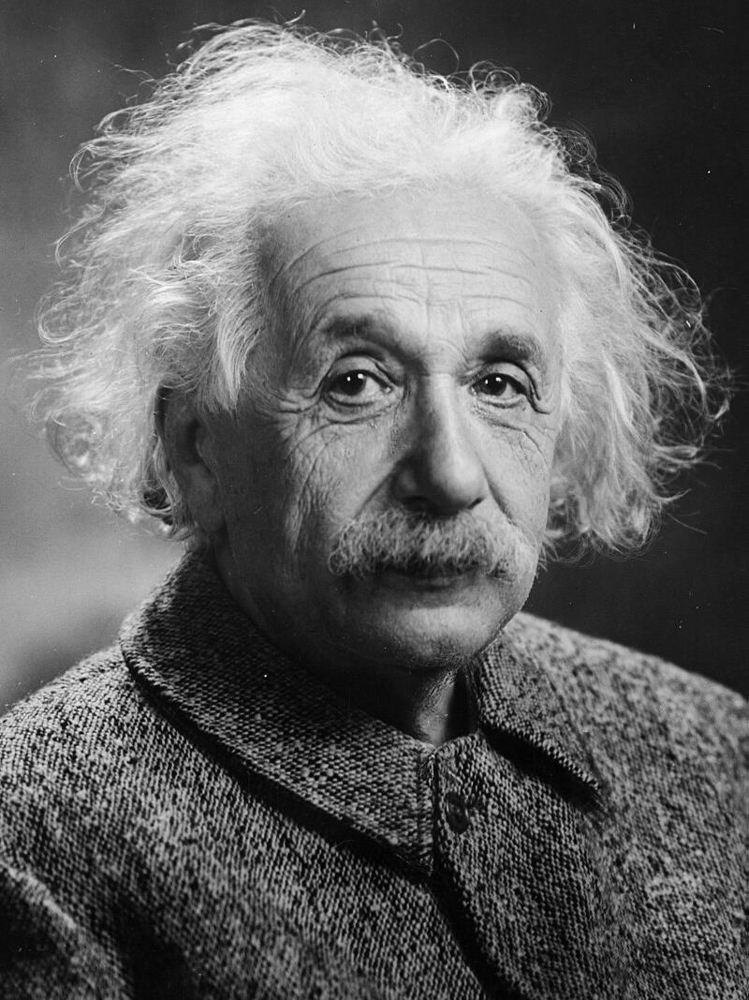

In [ ]:
# **Cell 7: 4.3. Linear Filters - Shift Filter (Spatial Shift)**
# ---
# Apply Shift Filter using cv2.filter2D and display the shifted image.

if original_image is not None:
    shifted_image = cv2.filter2D(original_image, -1, shift_kernel)
    print("\nImage Shifted Right by 1 Pixel:")
    cv2_imshow(shifted_image)
else:
    print("Please run Cell 2 to load the image first.")



Vertical Edges (Sobel):


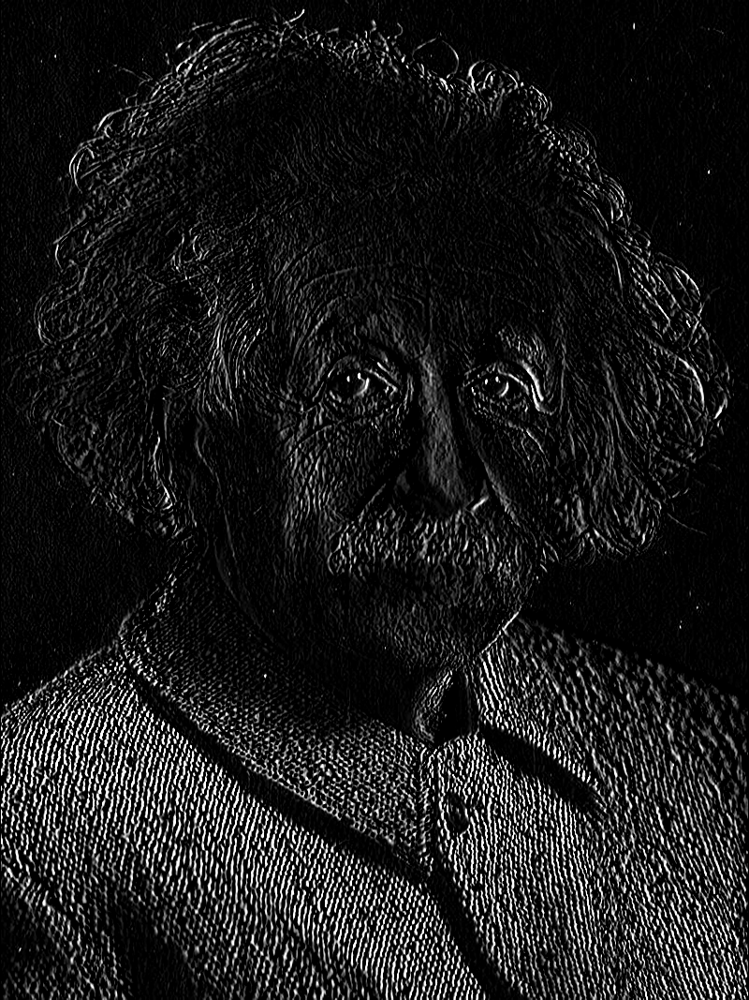


Horizontal Edges (Sobel):


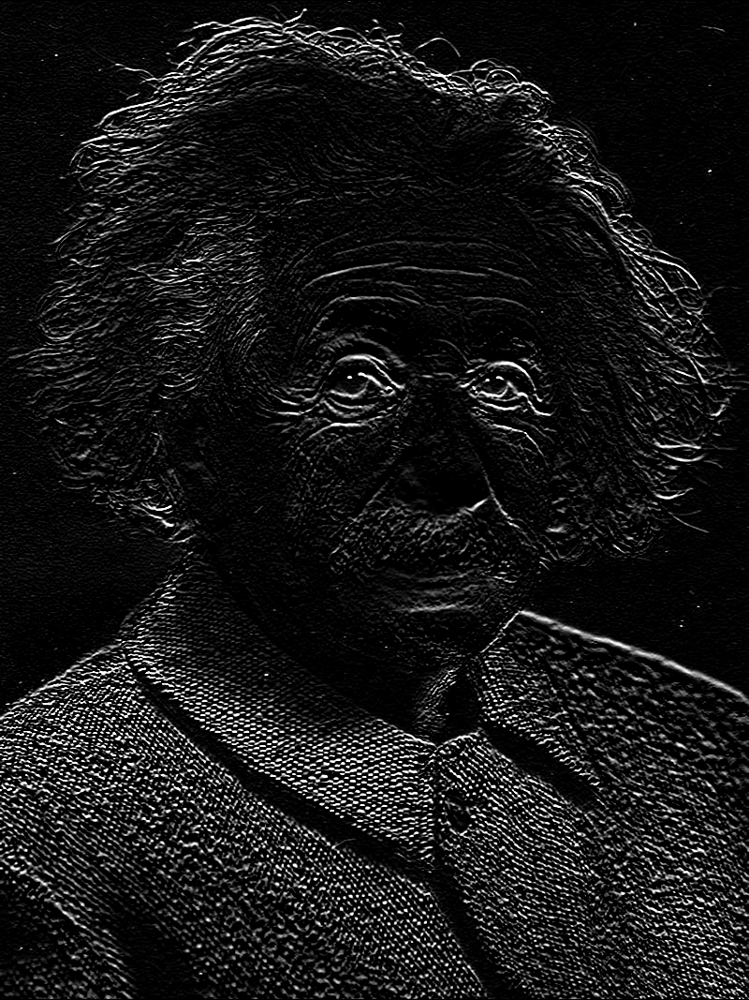


Sobel Edge Magnitude:


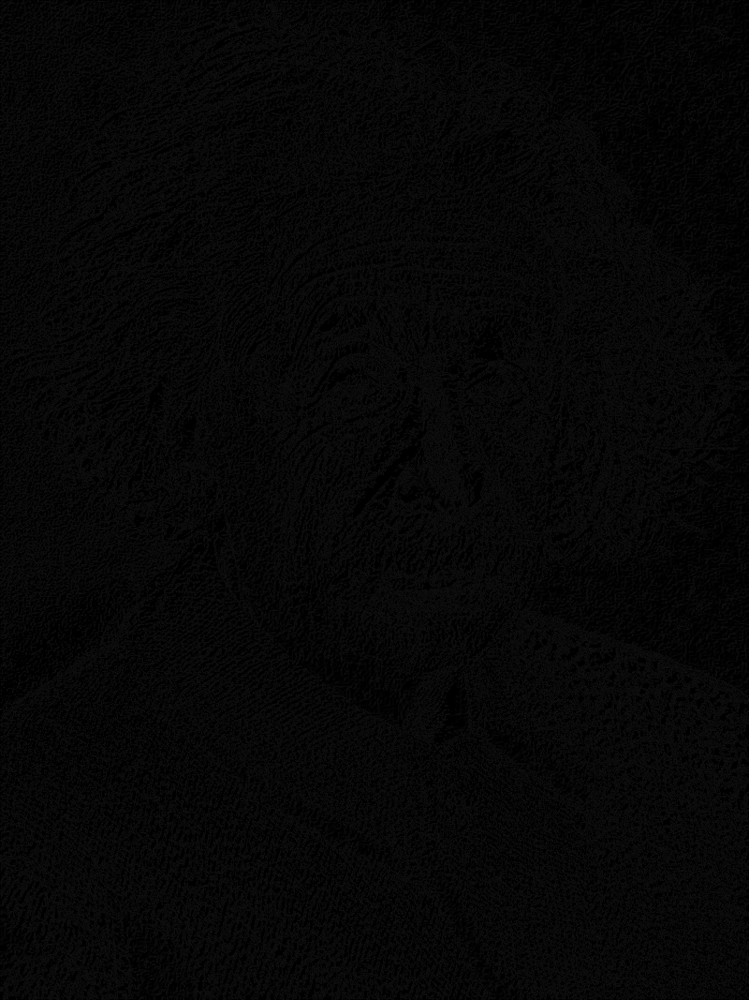

In [ ]:
# **Cell 8: 4.4. Linear Filters - Sobel Filters (Edge Detection)**
# ---
# Apply Vertical and Horizontal Sobel filters and display the edge images and magnitude.

if original_image is not None:
    vertical_edges = cv2.filter2D(original_image, -1, vertical_sobel_kernel)
    horizontal_edges = cv2.filter2D(original_image, -1, horizontal_sobel_kernel)

    print("\nVertical Edges (Sobel):")
    cv2_imshow(vertical_edges)

    print("\nHorizontal Edges (Sobel):")
    cv2_imshow(horizontal_edges)

    edge_magnitude = np.sqrt(np.square(vertical_edges) + np.square(horizontal_edges))
    edge_magnitude = np.uint8(edge_magnitude)
    print("\nSobel Edge Magnitude:")
    cv2_imshow(edge_magnitude)
else:
    print("Please run Cell 2 to load the image first.")


Image Filtered with Laplacian Filter (Raw Output - may show negative values):


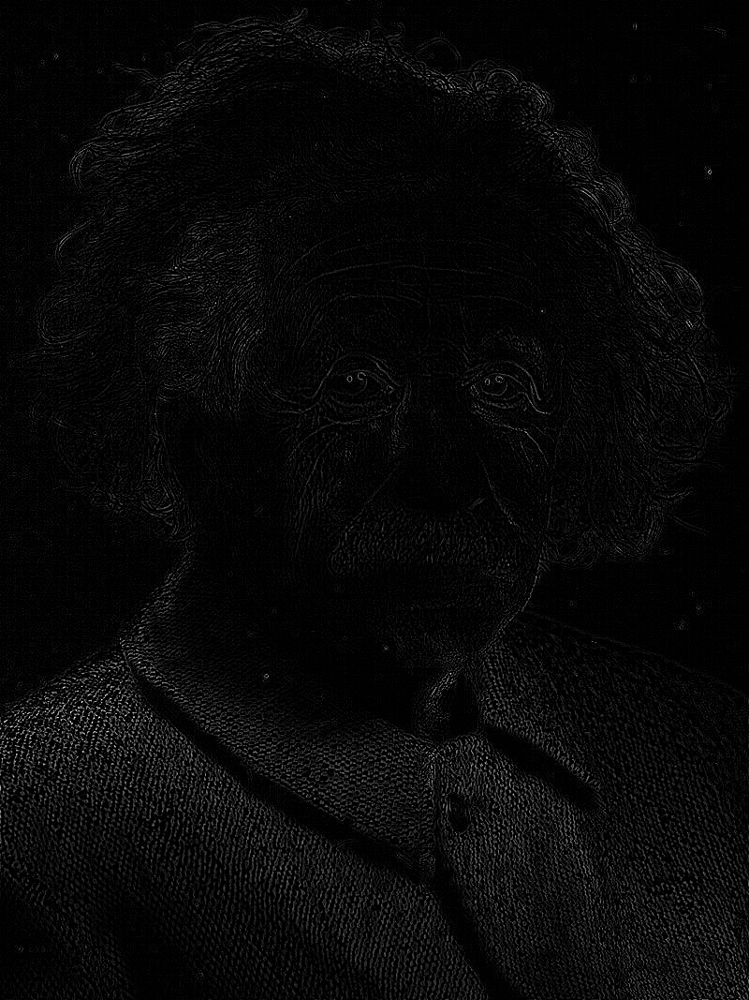


Sharpened Image (Original + Laplacian):


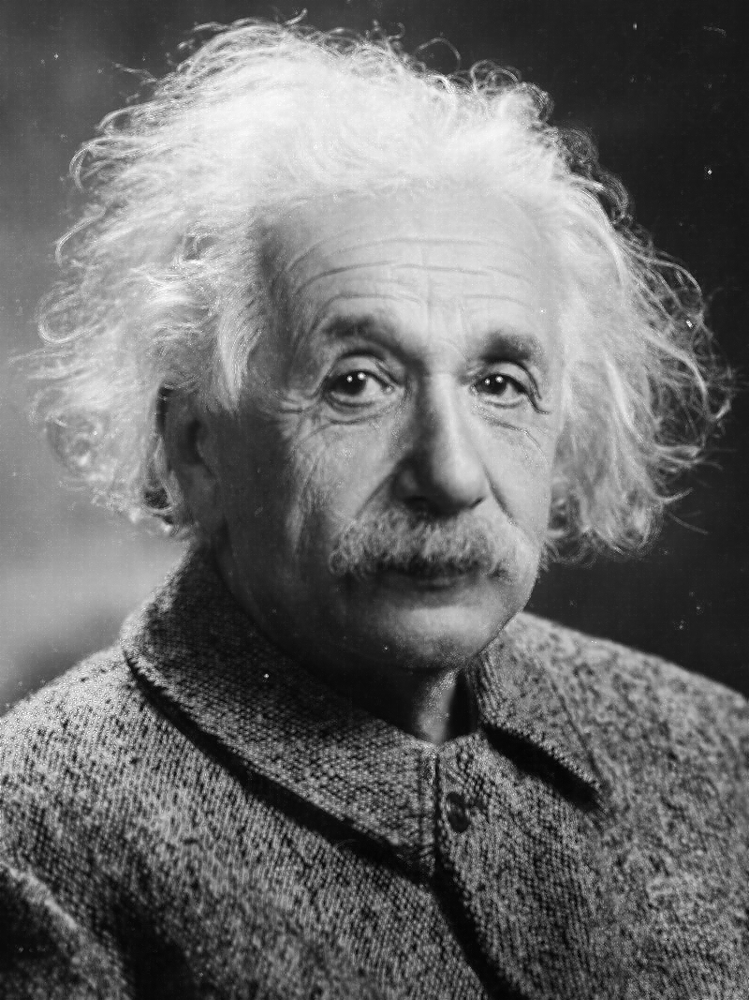

In [ ]:
# **Cell 9: 4.5. Linear Filters - Laplacian Filter (Sharpening)**
# ---
# Apply Laplacian Filter using cv2.filter2D and demonstrate sharpening.

if original_image is not None:
    laplacian_filtered_image = cv2.filter2D(original_image, -1, laplacian_kernel)
    print("\nImage Filtered with Laplacian Filter (Raw Output - may show negative values):")
    cv2_imshow(laplacian_filtered_image) # Raw Laplacian output

    sharpened_image = cv2.add(original_image, laplacian_filtered_image)
    print("\nSharpened Image (Original + Laplacian):")
    cv2_imshow(sharpened_image)
else:
    print("Please run Cell 2 to load the image first.")


Image Smoothed with Gaussian Filter (5x5):


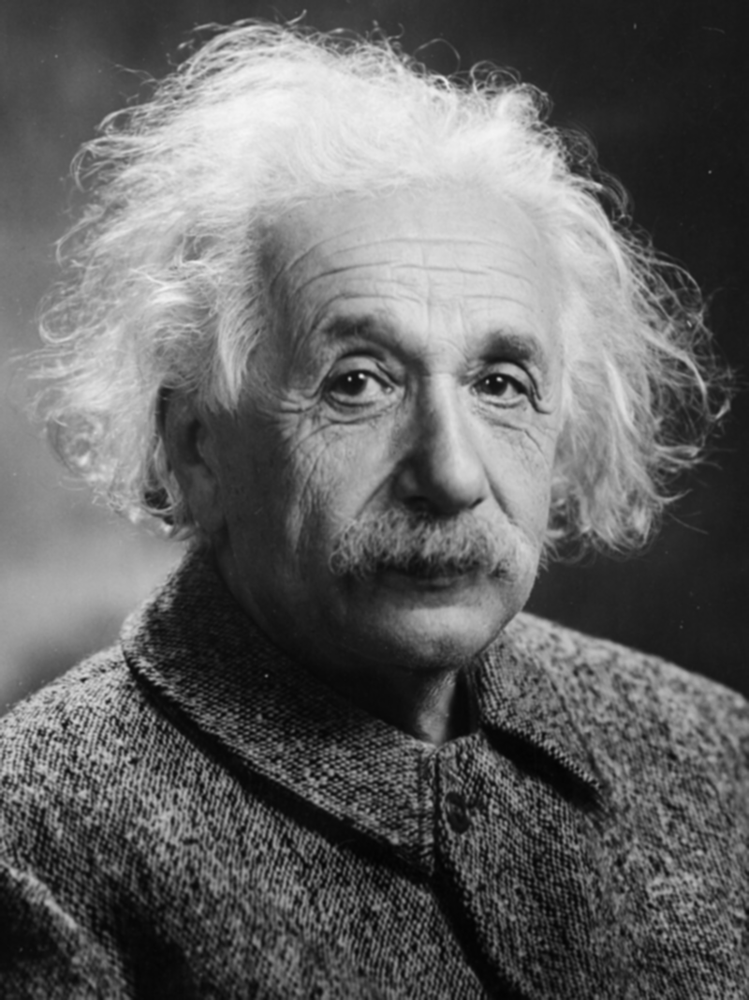

In [ ]:
# **Cell 10: 4.6. Linear Filters - Gaussian Filter (Smoothing)**
# ---
# Apply Gaussian Filter using cv2.GaussianBlur and display the smoothed image.

if original_image is not None:
    gaussian_smoothed_image = cv2.GaussianBlur(original_image, (5, 5), 0)
    print("\nImage Smoothed with Gaussian Filter (5x5):")
    cv2_imshow(gaussian_smoothed_image)
else:
    print("Please run Cell 2 to load the image first.")

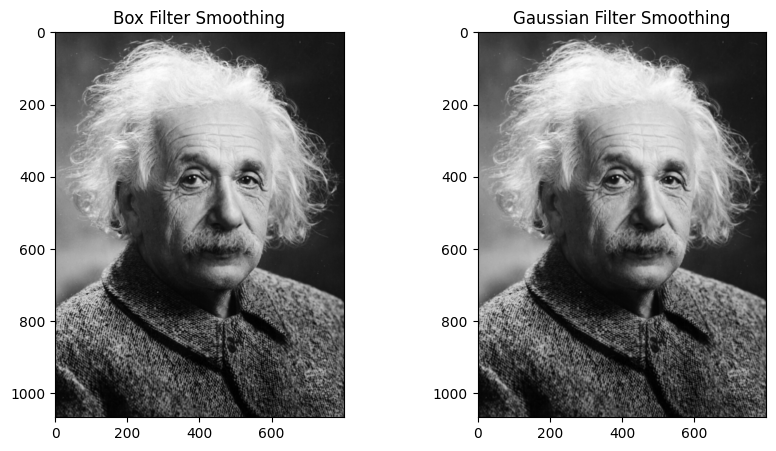

In [ ]:
# **Cell 11: Comparison - Box vs. Gaussian Smoothing (Visual)**
# ---
# Display Box and Gaussian smoothed images side-by-side for visual comparison using Matplotlib.

if original_image is not None:
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(smoothed_box_image, cmap='gray')
    plt.title('Box Filter Smoothing')

    plt.subplot(1, 2, 2)
    plt.imshow(gaussian_smoothed_image, cmap='gray')
    plt.title('Gaussian Filter Smoothing')

    plt.show()
else:
    print("Please run Cell 2 and Cell 5 & 10 for smoothing examples first.")


Image with Salt & Pepper Noise:


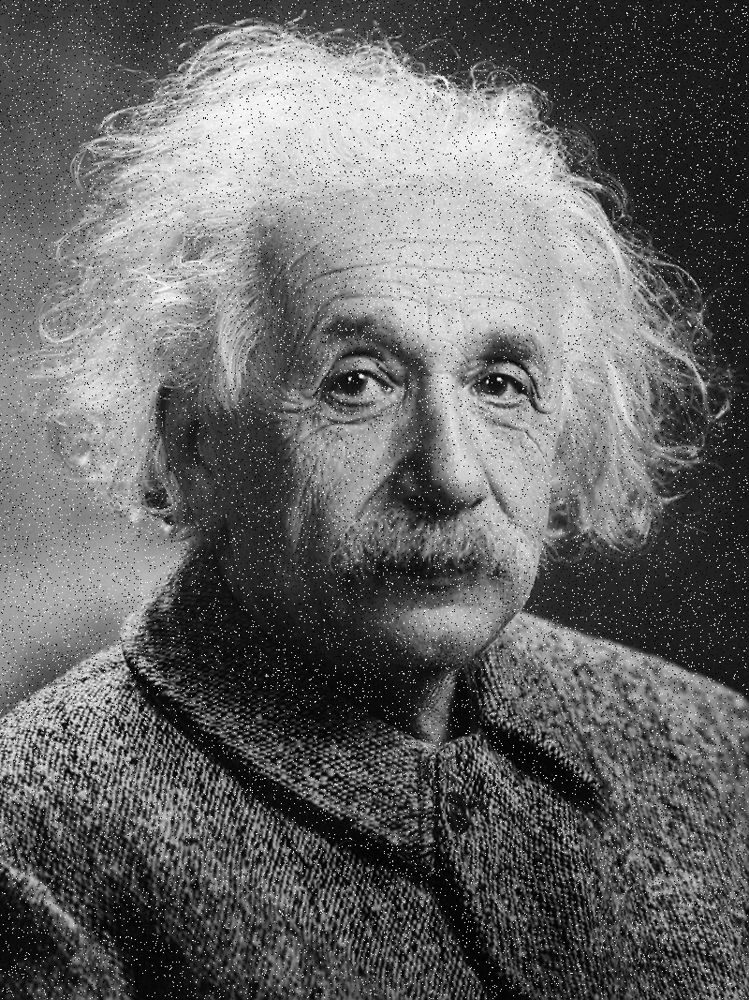


Image after Median Filtering (Noise Reduction):


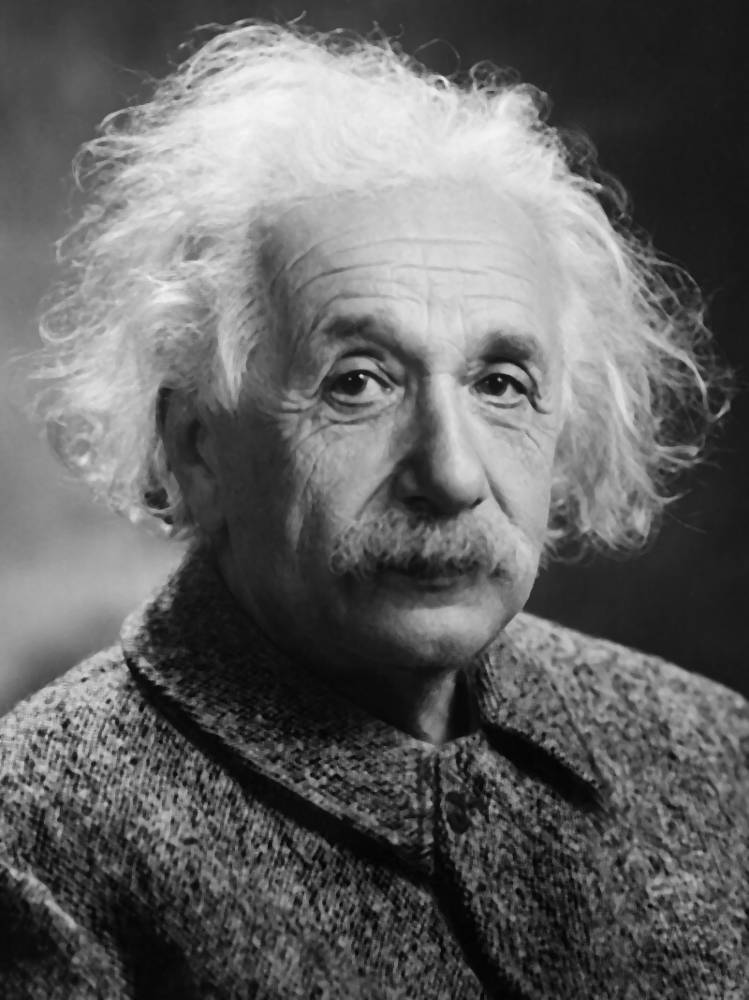

In [ ]:
# **Cell 12: 5. Non-Linear Filter - Median Filter (Noise Reduction)**
# ---
# Add Salt & Pepper noise to the original image, apply Median Filter, and display results.

if original_image is not None:
    def add_salt_pepper_noise(image, salt_prob, pepper_prob):
        noisy_image = np.copy(image)
        rows, cols = noisy_image.shape
        num_salt = np.ceil(salt_prob * image.size * 0.5)
        coords = [np.random.randint(0, i - 1, int(num_salt)) for i in noisy_image.shape]
        noisy_image[coords[0], coords[1]] = 255
        num_pepper = np.ceil(pepper_prob* image.size * 0.5)
        coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in noisy_image.shape]
        noisy_image[coords[0], coords[1]] = 0
        return noisy_image

    noisy_image = add_salt_pepper_noise(original_image, 0.05, 0.05) # 5% salt and pepper noise
    print("\nImage with Salt & Pepper Noise:")
    cv2_imshow(noisy_image)

    median_filtered_image = cv2.medianBlur(noisy_image, 5) # 5x5 kernel size for median filter
    print("\nImage after Median Filtering (Noise Reduction):")
    cv2_imshow(median_filtered_image)
else:
    print("Please run Cell 2 to load the image first.")